[![Open in Colab](https://colab.research.google.com/assets/colab-badge.svg)](https://colab.research.google.com/github/afrhu/climate_spiral.ipynb)

In [ ]:
# Install manim library
# Run this block once, then restart runtime, then run this block again
!sudo apt update
!sudo apt install libcairo2-dev ffmpeg \
    texlive texlive-latex-extra texlive-fonts-extra \
    texlive-latex-recommended texlive-science \
    tipa libpango1.0-dev
!pip install manim
!pip install IPython --upgrade

Hit:1 https://cloud.r-project.org/bin/linux/ubuntu jammy-cran40/ InRelease
Hit:2 https://developer.download.nvidia.com/compute/cuda/repos/ubuntu2204/x86_64  InRelease
Get:3 http://security.ubuntu.com/ubuntu jammy-security InRelease [110 kB]
Hit:4 http://archive.ubuntu.com/ubuntu jammy InRelease
Get:5 http://archive.ubuntu.com/ubuntu jammy-updates InRelease [119 kB]
Hit:6 https://ppa.launchpadcontent.net/c2d4u.team/c2d4u4.0+/ubuntu jammy InRelease
Hit:7 http://archive.ubuntu.com/ubuntu jammy-backports InRelease
Hit:8 https://ppa.launchpadcontent.net/deadsnakes/ppa/ubuntu jammy InRelease
Hit:9 https://ppa.launchpadcontent.net/graphics-drivers/ppa/ubuntu jammy InRelease
Hit:10 https://ppa.launchpadcontent.net/ubuntugis/ppa/ubuntu jammy InRelease
Fetched 229 kB in 4s (60.9 kB/s)
Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
18 packages can be upgraded. Run 'apt list --upgradable' to see them.
Reading package lists... Done
Building dependen

In [ ]:
#Test manim installation
from manim import *

# Obtain and prepare temperature data

In [ ]:
# Download data
!wget https://data.giss.nasa.gov/gistemp/tabledata_v4/GLB.Ts+dSST.csv

--2023-09-24 23:35:42--  https://data.giss.nasa.gov/gistemp/tabledata_v4/GLB.Ts+dSST.csv
Resolving data.giss.nasa.gov (data.giss.nasa.gov)... 129.164.128.233, 2001:4d0:2310:230::233
Connecting to data.giss.nasa.gov (data.giss.nasa.gov)|129.164.128.233|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 12603 (12K) [text/csv]
Saving to: ‘GLB.Ts+dSST.csv.1’

GLB.Ts+dSST.csv.1   100%[===================>]  12.31K  --.-KB/s    in 0s      

2023-09-24 23:35:45 (160 MB/s) - ‘GLB.Ts+dSST.csv.1’ saved [12603/12603]



In [ ]:
# Import libraries
%matplotlib inline
import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
# Load data
temp_data = pd.read_csv(
    "GLB.Ts+dSST.csv"
    , header=1 #select correct row for the header
    , usecols=range(13) # year + 12 months
)

# Transform so data has year, month and temperature columns
temp_data = pd.melt(temp_data, id_vars=['Year'], var_name='Month', value_name='Temperature')

# Use pd.to_datetime() to convert month names to numbers
temp_data['Month'] = pd.to_datetime(temp_data['Month'], format='%b').dt.month

In [ ]:
# Sort data
temp_data = temp_data.sort_values(by=['Year','Month'])
temp_data = temp_data.reset_index(drop=True)

# Rename the columns
temp_data = temp_data.rename(columns={
    'Year': 'year',
    'Month': 'month',
    'Temperature': 'value'
})

# Make sure value column is numeric
temp_data['value'] = pd.to_numeric(temp_data['value'], errors='coerce')

# Eliminate nan
temp_data = temp_data.dropna()

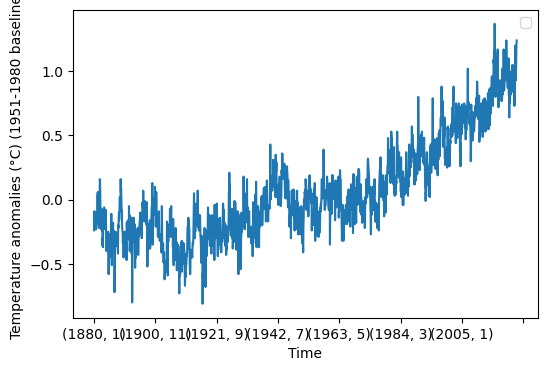

In [ ]:
# Visualize time series plot
temp_data = temp_data.set_index(['year', 'month'])
temp_data.plot(figsize=(6,4))
plt.xlabel("Time")
plt.ylabel(u"Temperature anomalies (°C) (1951-1980 baseline)")
plt.legend("")
temp_data = temp_data.reset_index()

In [ ]:
# Save as csv
temp_data.to_csv("temperatures.csv", index=False)

# Create Climate Spiral

In [ ]:
%%manim -qh -v WARNING --disable_caching ClimateSpiral

from manim import *
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import math

colormap = plt.get_cmap('RdBu_r')
min_value = -1.5
max_value = 1.5

def get_color(value):
  normalized_value = (value - min_value) / (max_value - min_value)
  color = colormap(normalized_value)
  # Convert the RGB color tuple to hex format using to_hex
  hex_color = plt.cm.colors.to_hex(color)
  return hex_color

class ClimateSpiral(ThreeDScene):

  def construct(self):

    #Load temperature anomalies data
    self.df = temp_data = pd.read_csv("temperatures.csv")
    self.len = len(self.df)
    self.initial_year = self.df["year"][0]
    self.year_heigth = 6.0/(2023-self.initial_year)
    self.max_height = (2023 - self.initial_year)*self.year_heigth

    # Variable for line segments in spiral
    self.start_point = None
    self.end_point = None
    self.colors = []

    # Create group of elements
    self.axis = VGroup()
    self.all_elements = VGroup()

    self.years_elements = VGroup()

    self.label_year = DecimalNumber(
      self.initial_year
      , num_decimal_places=0
    )

    self.color_green = PURE_GREEN
    self.color_text = WHITE

    # Simulate ortographic projection
    self.set_camera_orientation(phi=0, theta=-PI/2.0, focal_distance=1000)

    self.add_axis()
    self.animate_spiral()
    self.wait(1)
    self.play(FadeOut(self.axis), FadeOut(self.label_year))
    self.move_camera(phi=PI/2.0, theta=-PI/2.0, focal_distance=1000)
    self.wait(1)
    self.show_vertical_elements()
    self.wait(3)

  def add_axis(self):
    # Define colors
    main_color = YELLOW

    # Define the radii and their labels
    radii = [1, 2, 3]
    labels = ["-1°C", "0°C", "+1°C"]

    # Add non-3D circles for each radius and labels
    for radius, label_text in zip(radii, labels):

      circle_color = main_color

      if "0°C" in label_text:
        circle_color = self.color_green

      circle = Circle(radius=radius, color=circle_color, fill_opacity=0.0)
      circle.move_to(ORIGIN)
      #self.add(circle)
      self.axis.add(circle)

      label = Tex(label_text)
      label.scale(0.5)  # Adjust the size of the label as needed

      label.next_to(circle, UP, buff = -0.3)
      label.set_color(circle_color)
      #self.add(label)
      self.axis.add(label)

    # Define the months and their positions (in radians)
    months = ["Jan", "Feb", "Mar", "Apr", "May", "Jun", "Jul", "Aug", "Sep", "Oct", "Nov", "Dec"]

    # Add labels for each month
    for idx, month in enumerate(months):
      label = Tex(month, color = main_color)
      label.scale(0.8)  # Adjust the size of the label as needed
      #label.next_to(polar_plane.coords_to_point(2.5, angle))
      r = radii[-1]+0.5
      theta = idx/6.0*PI
      x = r*np.cos(-(theta-PI*0.5))
      y = r*np.sin(-(theta-PI*0.5))
      label.move_to([x,y,0])
      #self.add(label)
      self.axis.add(label)

    #self.axis2 = self.axis.copy()
    #self.add(self.axis2)

    self.axis.shift((self.max_height + 2.0)*OUT)
    self.add(self.axis,self.label_year)

  def show_vertical_elements(self):

    elements = VGroup()

    radii = [2, 3]
    labels = ["0°C", "+1°C"]

    # T ranges
    for radius, label_text in zip(radii, labels):
      z_pos = (2023 - self.initial_year)*self.year_heigth
      limit1 = Line(np.array([radius,0,0]), np.array([radius,0,z_pos]), color= YELLOW)
      limit2 = Line(np.array([-radius,0,0]), np.array([-radius,0,z_pos]), color= YELLOW)
      label = Text(label_text, color = YELLOW).scale(0.5)
      label.rotate(PI/2.0, axis = RIGHT)

      label1 = label.copy().move_to([radius,0,z_pos+0.5])
      label2 = label.copy().move_to([-radius,0,z_pos+0.5])
      elements.add(limit1, limit2, label1, label2)

    # Years
    for i in range(1880,2023,20):

      if i == 2020:
        i = 2023

      rect = Rectangle(width=1.0, height=0.4, color=YELLOW, fill_color =YELLOW, fill_opacity=0.4)
      rect.rotate(PI/2.0, axis = RIGHT)
      rect.move_to([0,0,(i - self.initial_year)*self.year_heigth])
      elements.add(rect)

      label = Text(str(i), color = self.color_text)
      label.scale(0.5)
      label.rotate(PI/2.0, axis = RIGHT)
      label.move_to([0,0,(i - self.initial_year)*self.year_heigth])
      elements.add(label)

    #self.all_elements(elements)
    #self.all_elements.shift(2*DOWN)
    elements.shift(-(2023 - self.initial_year)*self.year_heigth*0.5*OUT)

    self.play(FadeIn(elements))
    #self.add(elements)

  def animate_spiral(self):

    spiral = VGroup()

    # Define an updater function to update the DecimalNumber
    def update_count(obj):
      index = len(spiral)- 1
      yyear = int(self.df["year"][index])
      if obj.get_value() != yyear:
        obj.set_value(yyear)
      if not (len(self.colors) == 0):
        if obj.get_color != self.colors[-1]:
          obj.set_color(self.colors[-1])

    # Add the updater function to the count_label
    self.label_year.add_updater(update_count)


    df = self.df

    big_segment = VGroup()

    for index, row in df.iterrows():

      if index > len(df)-2:
        break

      #if index > 120:
      #  break

      # Get values
      year = row['year']
      month = row['month']-1
      val = row['value']
      next_year = df["year"][index+1]
      next_month = df["month"][index+1]-1
      next_val = df["value"][index+1]

      if next_month == 0:
        next_month = 12

      steps = 3
      segment = VGroup()

      for i in range(steps):

        # Interpolate between adjacent data points for months and values
        t_fraction = i*1.0/steps
        month_frac = (1 - t_fraction)*month + t_fraction*next_month
        val_frac = (1 - t_fraction)*val + t_fraction*next_val

        # Calculate coordinates
        theta = -((month_frac)/6*PI-PI*0.5)  # Angle in radians for month starting on top
        r = val_frac + 2.0 # temperature value with zero on radius 2
        x = r*np.cos(theta)
        y = r*np.sin(theta)
        z = (year-self.initial_year)*self.year_heigth - self.max_height*0.5

        if self.start_point is None: #Check if the spiral is empty
          self.start_point = np.array([x,y,z])
        else:
          self.end_point = np.array([x,y,z])

          color = get_color(val_frac)
          line = Line(self.start_point, self.end_point, color= color)
          line.set_opacity(0.8)
          self.start_point = self.end_point

          if (i == 0):
            self.colors.append(color)
          segment.add(line)
          big_segment.add(line)

      spiral.add(segment)

      if index%6 == 0 or index == len(df)-2:
        self.play(Create(big_segment), run_time=0.0005)
        big_segment = VGroup()

      #self.play(Create(segment), run_time=0.0005)

    # Remove the updater to stop updating the count_label
    self.label_year.clear_updaters()

    self.wait(1)


